In [ ]:
!pip install open3d

import open3d as o3d
import cv2
import numpy as np
import os
import glob
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

In [ ]:
CHECKERBOARD = (7,7)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
 
objpoints = []
imgpoints = []

objp = np.zeros((1, CHECKERBOARD[0] * CHECKERBOARD[1], 3), np.float32)
objp[0,:,:2] = np.mgrid[0:CHECKERBOARD[0], 0:CHECKERBOARD[1]].T.reshape(-1, 2)
prev_img_shape = None

calibration_images = glob.glob('/content/drive/MyDrive/images/*.jpg')

for idx, fname in enumerate(calibration_images):
    img = cv2.imread(fname)
    img = cv2.resize(img, (800, 500))
 
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # plt.imshow(gray)
    ret, corners = cv2.findChessboardCorners(gray, (CHECKERBOARD[0], CHECKERBOARD[1]), None)
    
    # If the corners are found, add object points and image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (CHECKERBOARD[0], CHECKERBOARD[1]), corners, ret)
        cv2_imshow(img)
        
        # cv2.waitKey(500)  

In [ ]:
len(imgpoints)

25

In [ ]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)


1.3) Radial Distortion coefficient 

In [ ]:
(r1,r2,t1,t2,r3) = dist[0]
print("r1 r2 t1 t2 r3")


r1 r2 t1 t2 r3


array([[ 0.03022814, -1.00161046, -0.00574196,  0.01133526,  1.56754933]])

In [ ]:
folder_path = '/content/drive/MyDrive/chess/calibrated'

if os.path.exists(folder_path):
    # Iterate over all the files in the folder and delete them
    for filename in os.listdir(folder_path):
        file_path = os.path.join(folder_path, filename)
        if os.path.isfile(file_path):
            os.unlink(file_path)
            
for i in range(5):
  img = cv2.imread(calibration_images[i])
  h,  w = img.shape[:2]
  newcameramtx, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))

  
  dst = cv2.undistort(img, mtx, dist, None, newcameramtx)
  
  x, y, w, h = roi
  dst = dst[y:y+h, x:x+w]
  calibrated = cv2.imwrite('calibresult.png', dst)
    
  ext = str(i) + '.jpg'
  cv2.imwrite(os.path.join(folder_path,ext), cv2.imread('/content/calibresult.png'))

1.4 & 1.5


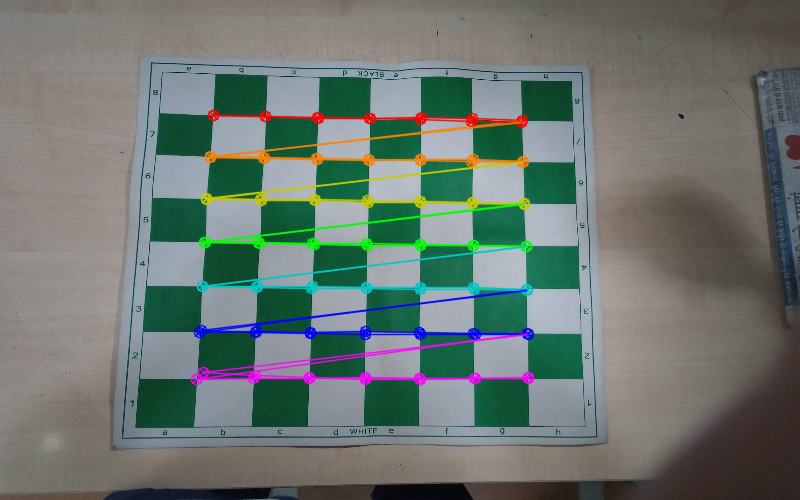

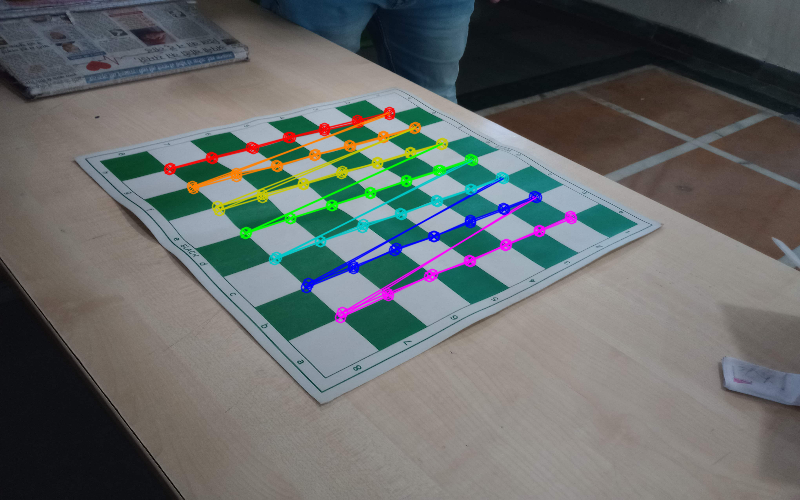

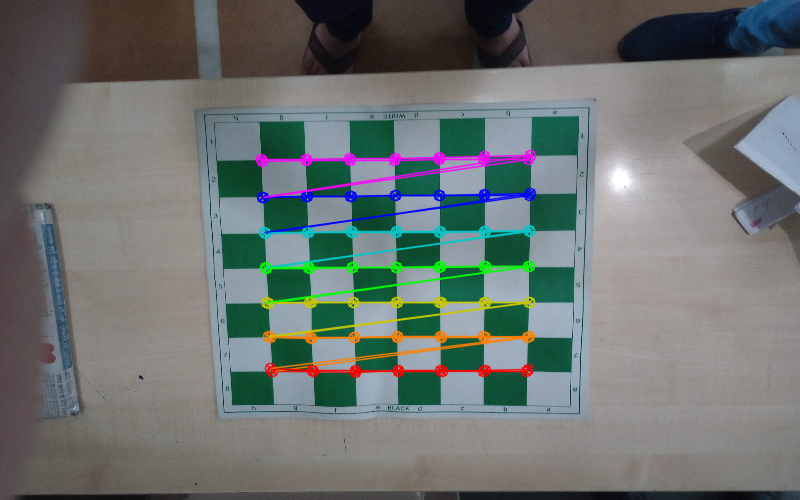

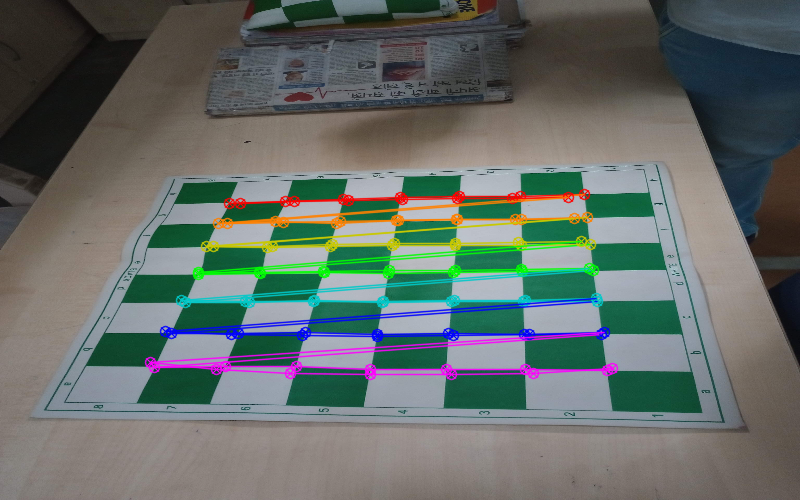

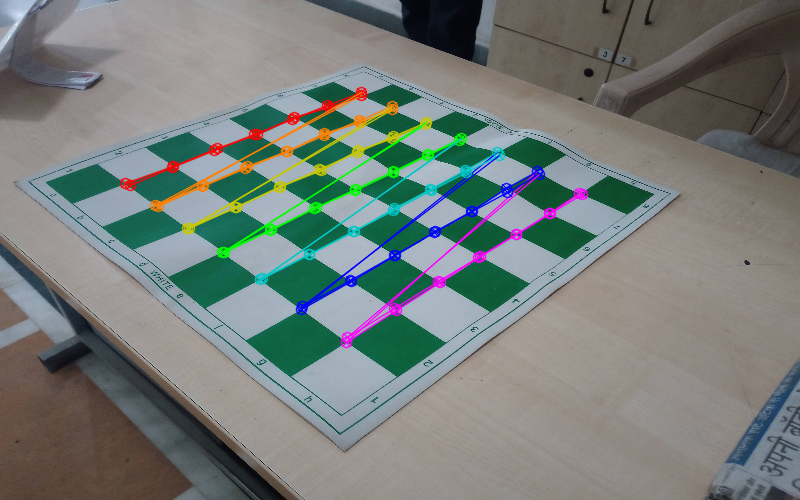

...

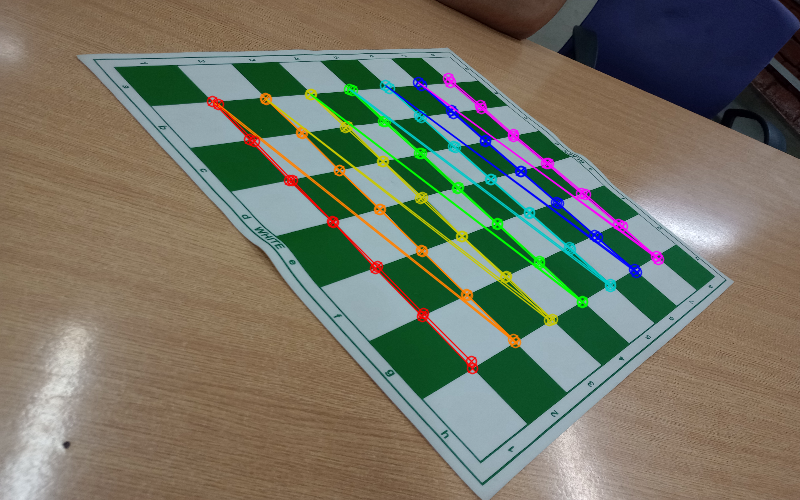

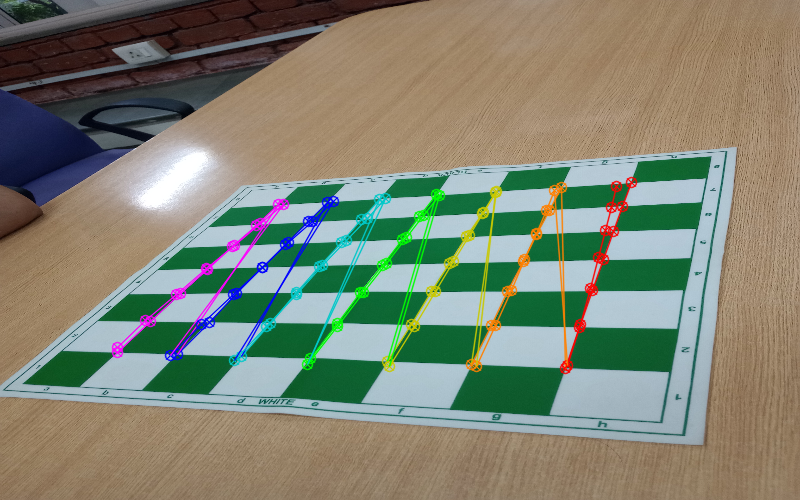

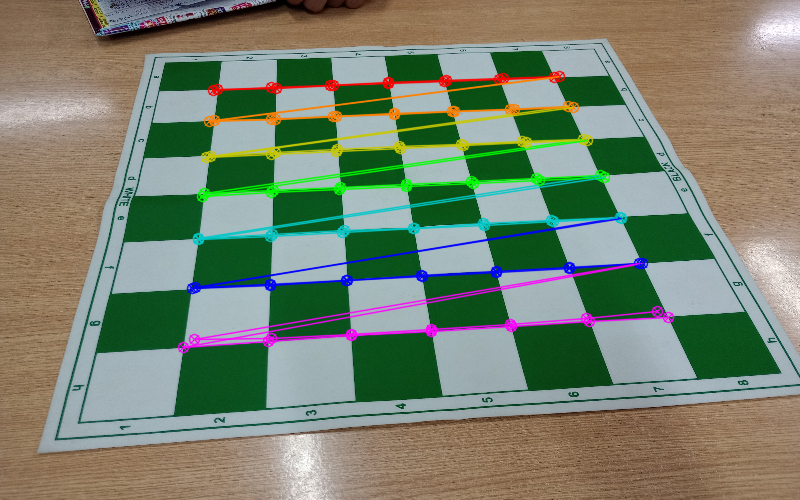

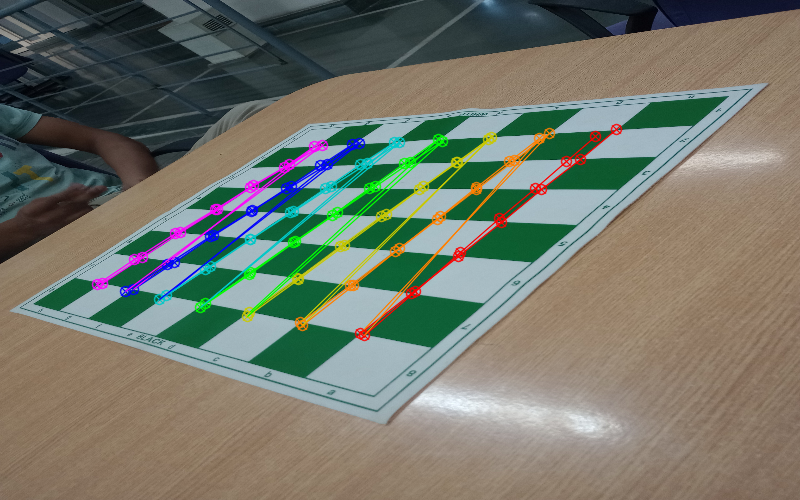

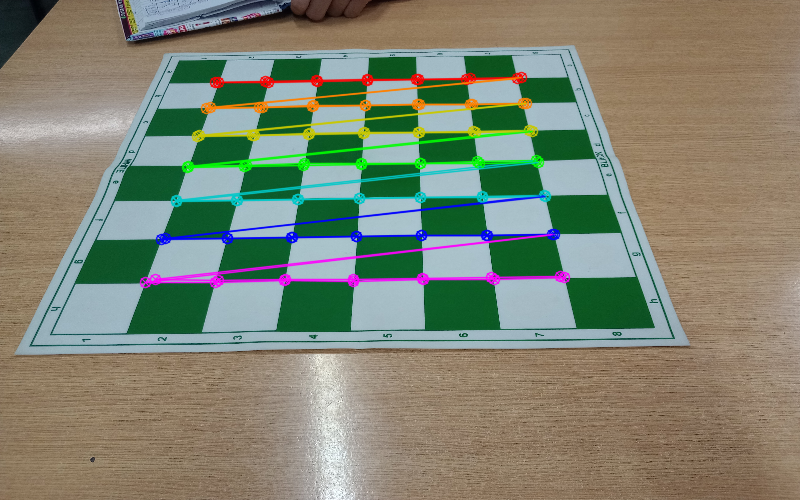

In [46]:

observed_pts = imgpoints
intrinsic_mtx = mtx

projected_pts = []

up_rvecs = np.array(tuple(tuple(arr.flatten()) for arr in rvecs))
up_tvecs = np.array(tuple(tuple(arr.flatten()) for arr in tvecs))
[up_dist] = dist

for i in range(len(objpoints)):

  img = cv2.imread(calibration_images[i])
  img = cv2.resize(img, (800, 500))
  proj_pts, _ = cv2.projectPoints(objpoints[i][0], up_rvecs[i], up_tvecs[i], intrinsic_mtx, up_dist)
  projected_pts.append(proj_pts)
  
  img = cv2.drawChessboardCorners(img, CHECKERBOARD, imgpoints[i], True)
  img = cv2.drawChessboardCorners(img, CHECKERBOARD, proj_pts, True)
  
  cv2_imshow(img)


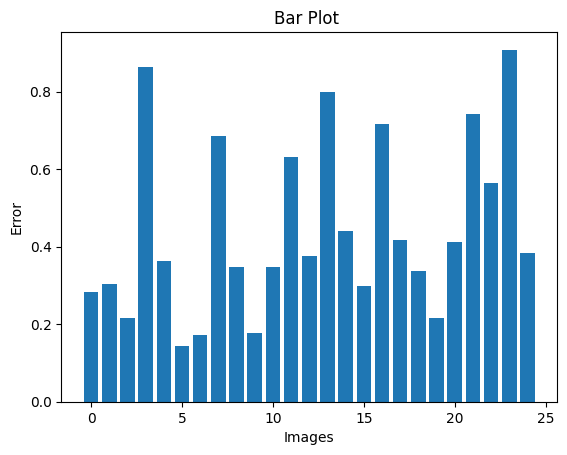

mean:  0.4456442528068992
standard deviation:  0.22281357810921024


In [47]:

# Compute reprojection error
observed_pts = np.array(observed_pts)
projected_pts = np.array(projected_pts)
# observed_pts.shape -> (10,49,1,2)
observed_pts = np.reshape(observed_pts,(len(observed_pts),49,2))
projected_pts = np.reshape(projected_pts,(len(projected_pts),49,2))

projErr = []
for i in range(len(observed_pts)):
  norm = cv2.norm(observed_pts[i], projected_pts[i], cv2.NORM_L2)/49
  projErr.append(norm)


# Create a bar plot
plt.bar(range(len(projErr)), projErr)

# Add x and y labels and title
plt.xlabel('Images')
plt.ylabel('Error')
plt.title('Bar Plot ')

# Show the plot
plt.show()

mean = np.mean(projErr)
std = np.std(projErr)
print("mean: ",mean)
print("standard deviation: ",std)

1.6


In [56]:
world_points = np.array([[1,1,0],[1,2,0],[2,3,0]])
normal  = np.cross(np.array(world_points[1]-world_points[0]), np.array(world_points[2]-world_points[0]))

rotation_matrix = []

for vec in rvecs:
  R, _ = cv2.Rodrigues(vec)
  rotation_matrix.append(R)

plane_normal = []
for i in range(len(rotation_matrix)):
  nrml = np.matmul(normal, np.array(rotation_matrix[i]))
  plane_normal.append(nrml)
  
plane_normal = np.array(plane_normal)


(25, 3)